In [36]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
display(HTML("<style>.output_result { max-width:90% !important; }</style>"))

In [37]:
import sys
import os
sys.path.append(os.path.dirname(os.getcwd()))
import os
import random
import math
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
import wandb
from tqdm import tqdm
from datetime import datetime
import pickle

import cv2
from skimage.io import imsave
from skimage.transform import resize
from skimage.measure import block_reduce
import skimage.segmentation as seg

from torch.utils.data import DataLoader
from torchvision.transforms import Compose
from kornia.geometry.transform import Resize
from kornia.augmentation import Normalize

from config import TrainConfig, GPU_ID
from dataio.dataloader import probe_data_folder, BraTS18Binary
from models.resnet import get_resnet50_attn_classifier
from models.unet import get_unet_encoder_classifier

figsize = (24, 24)

os.environ["CUDA_VISIBLE_DEVICES"] = GPU_ID

In [38]:
# Model directory and configuration
# base_dir = '/mnt/ml-srv1/home/tomron27/projects/regex/logs/resnet50_2attn_tau_kl/20210508_23:00:17'
# model_file = 'resnet50_2attn_tau_kl__best__epoch=085_score=0.9968.pt'

# base_dir = '/mnt/ml-srv1/home/tomron27/projects/regex/logs/resnet50_baseline/20210509_15:01:39'
# model_file = 'resnet50_baseline__best__epoch=072_score=0.9486.pt'
# config_file = "params.p"

# base_dir = "/mnt/ml-srv1/home/tomron27/projects/regex/logs/resnet50_baseline/20210510_00:59:43"
# model_file = "resnet50_baseline__best__epoch=111_score=0.9451.pt"

base_dir = "/mnt/ml-srv1/home/tomron27/projects/regex/logs/resnet50_marginal_loss/20210510_14:38:28"
model_file = "resnet50_marginal_loss__best__epoch=081_score=0.9968.pt"

base_dir = "/mnt/ml-srv1/home/tomron27/projects/regex/logs/unet_encoder_4attn_marginals/20210511_14:28:57/"
model_file = "unet_encoder_4attn_marginals__best__epoch=003_score=0.9947.pt"

config_file = "params.p"

config_handler = open(os.path.join(base_dir, config_file), 'rb')
params = pickle.load(config_handler)
params["weights"] = model_path = os.path.join(base_dir, model_file)

transforms = Compose([
                Normalize(mean=torch.tensor([149.56119, 165.83559, 166.13501, 112.61901]),
                          std=torch.tensor([636.8766, 653.8386, 759.8256, 718.83594])),
                Resize((256, 256))])
mask_transforms = Resize((256, 256))

In [39]:
# Load dataset
train_metadata, val_metadata, _ = probe_data_folder(params["data_path"],
                                                 train_frac=params["train_frac"],
                                                 bad_files=params["bad_files"],
                                                 subsample_frac=params["subsample_frac"])

# Datasets
# train_dataset = BraTS18Binary(params["data_path"],
#                         train_metadata,
#                         transforms=transforms,
#                         shuffle=True,
#                         get_mask=True,
#                         random_state=params["seed"],
#                         prefetch_data=params["prefetch_data"])
val_dataset = BraTS18Binary(params["data_path"],
                      val_metadata,
                      transforms=transforms,
                      prefetch_data=params["prefetch_data"],
                      get_mask=True,
                      shuffle=True)

# Dataloaders
# train_loader = DataLoader(dataset=train_dataset,
#                           num_workers=1,
#                           pin_memory=True,
#                           batch_size=1,
#                           shuffle=False)
val_loader = DataLoader(dataset=val_dataset,
                        num_workers=1,
                        pin_memory=True,
                        batch_size=1,
                        shuffle=True)

  Total of 208 train patients, 52 test patients
  Total of 17282 train slices, 4374 test slices


In [40]:
# Model
# model = get_resnet50_attn_classifier(**params)
model = get_unet_encoder_classifier(**params)
# Cuda
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)

Loading pretrained model from: '/mnt/ml-srv1/home/tomron27/projects/regex/logs/unet_encoder_4attn_marginals/20210511_14:28:57/unet_encoder_4attn_marginals__best__epoch=003_score=0.9947.pt'
Total parameters: 5022214
Total trainable parameters: 307718


In [41]:
y_true = []
y_pred = []
y_prob = []
images = []
model_attns = []
model.eval()

for j, sample in tqdm(enumerate(val_loader), total=len(val_loader)):
    # Image + Prediction
    if j > 50:
        break
    mri, (targets, masks) = sample
    mri_image = mri.detach().cpu().squeeze(0).squeeze(0).numpy()
    targ = targets.detach().cpu().item()
    mask = masks.detach().cpu()
    mask = mask_transforms(mask.unsqueeze(0)).squeeze(0)
    y_true.append(targ)
    
    mri = mri.to(device)
    outputs, attn, marginals = model(mri)
    probs = torch.softmax(outputs, dim=1).cpu().detach()[0]
    y_prob.append(probs.numpy())
    y_pred.append(torch.argmax(probs).item())
    img_fname = f"image_{j:04d}_pred={str(probs.numpy().round(2))}_label={targ}.npy"
    images.append((img_fname, mri_image, mask))
    
    # Attns
    attns = []
    for i, attn_step in enumerate(attn):
        shape = list(attn_step.shape[1:])
        attn = attn_step.squeeze(0).detach().cpu().numpy()
        attn_fname = f"image_{j:04d}_attn_level={i+1}_shape={shape}"
        attns.append((attn_fname, attn))
    model_attns.append(attns)

  1%|          | 51/4374 [00:01<01:56, 37.22it/s]


In [42]:
from sklearn.metrics import confusion_matrix, precision_score, recall_score, roc_auc_score, f1_score, accuracy_score, balanced_accuracy_score
print(balanced_accuracy_score(y_true, y_pred))
print(confusion_matrix(y_true, y_pred))
print(confusion_matrix(y_true, y_pred, normalize="true"))

1.0
[[28  0]
 [ 0 23]]
[[1. 0.]
 [0. 1.]]


In [43]:
modality_idx = 3

def plot_attns_raw(idx):
    if not isinstance(idx, int):
        row = idx
    else:
        row = model_attns[idx]
    img_fname, img, mask = images[idx]
    img = img[modality_idx]
    fig, axes = plt.subplots(1,6,figsize=figsize)
    fig.subplots_adjust(hspace=-0.5)
    axes[0].imshow(img, cmap="gray")
    axes[0].set_title(img_fname, fontsize=14)
    axes[0].axis('off')
    axes[1].imshow(img, cmap="gray")
    axes[1].imshow(mask[0], cmap="Greens", alpha=0.4)
    axes[1].axis('off')
    vmin = None #row[-1][1].min()
    vmax = None #row[-1][1].max()
    for j, (ax, attn_plot) in enumerate(zip(axes.flat[2:], row)):
        attn_fname, attn_img = attn_plot
        im = ax.imshow(attn_img, cmap="jet", vmin=vmin, vmax=vmax)
        attn_fname += f"\nmin: {attn_img.min():.5f}, max:{attn_img.max():.5f}"
        ax.set_title(attn_fname, fontsize=8)
    plt.show()
    
def plot_attns(idx):
    if not isinstance(idx, int):
        row = idx
    else:
        row = model_attns[idx]
    img_fname, img, mask = images[idx]
    img = img[modality_idx]
    fig, axes = plt.subplots(1,6,figsize=figsize)
    fig.subplots_adjust(hspace=-0.5)
    axes[0].imshow(img, cmap="gray")
    axes[0].set_title(img_fname, fontsize=14)
    axes[0].axis('off')
    axes[1].imshow(img, cmap="gray")
    axes[1].imshow(mask[0], cmap="Greens", alpha=0.4)
    axes[1].axis('off')
    vmin = None #row[-1][1].min()
    vmax = None #row[-1][1].max()
    for j, (ax, attn_plot) in enumerate(zip(axes.flat[2:], row)):
        attn_fname, attn_img = attn_plot
        attn_image_resize = resize(attn_img, img.shape)
        ax.imshow(img, cmap="gray")
        im = ax.imshow(attn_image_resize, cmap="jet", alpha=0.4, vmin=vmin, vmax=vmax)
        attn_fname += f"\nmin: {attn_img.min():.5f}, max:{attn_img.max():.5f}"
        ax.set_title(attn_fname, fontsize=8)
        ax.axis('off')
    axes[-1].axis('off')
    plt.show()
    plot_attns_raw(idx)

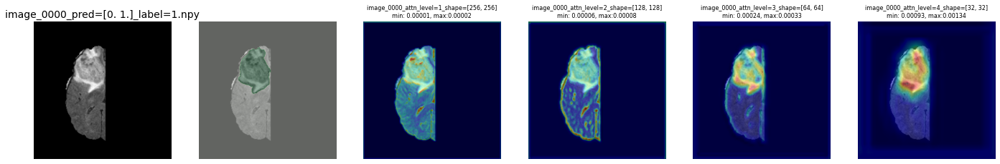

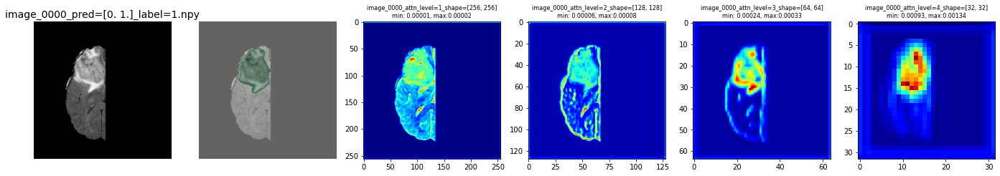

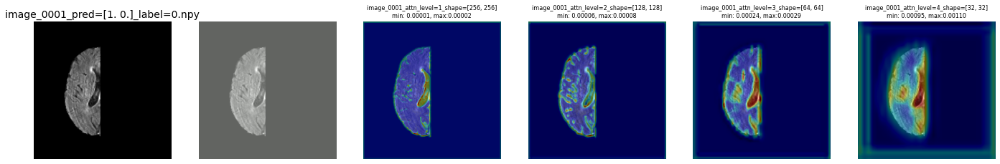

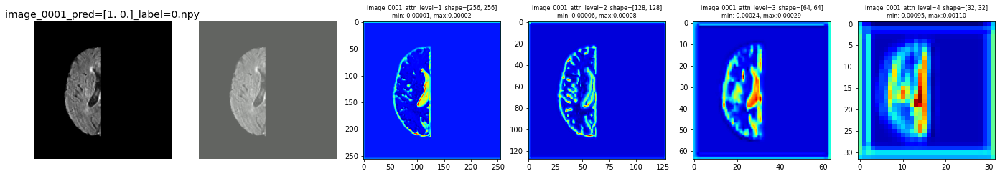

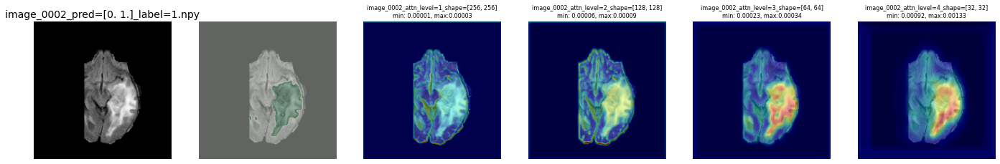

...

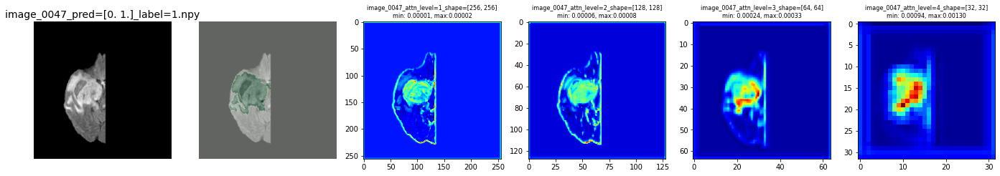

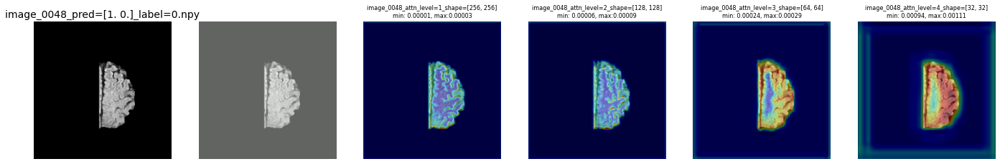

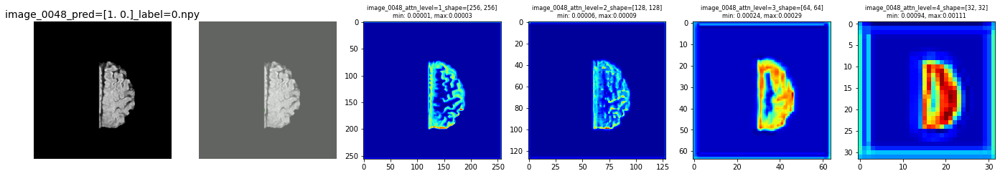

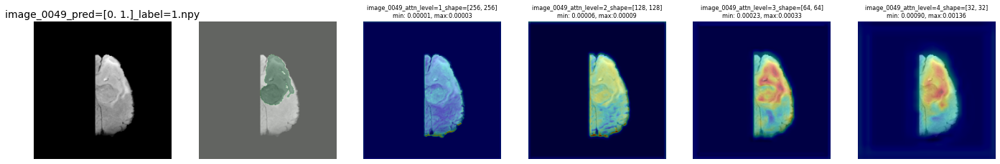

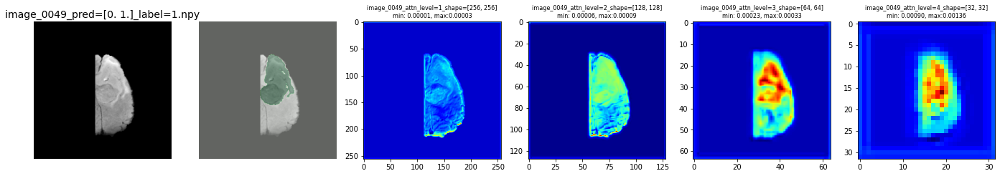

In [44]:
for i in range(50):
    plot_attns(i)